# Dataset: sentiment-analysis-on-movie-reviews

The raw-data can be downloaded from http://www.kaggle.com/c/sentiment-analysis-on-movie-reviews/data. </p>
First, let's explore the dataset using pandas. The columns of the dataset are tab-delimited. The dataset contains 156060 instances:

In [116]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from bs4 import BeautifulSoup
import re
from tqdm import tqdm
# import nltk
# nltk.download('omw-1.4')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

from keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from keras.utils import pad_sequences
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='bs4')

# nltk.download('stopwords')
# nltk.download('wordnet')
# nltk.download('punkt')

In [117]:
import os 
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.impute import KNNImputer

In [118]:
def read_file(path):
    filename, extension = os.path.splitext(path)

    if extension == '.csv':
        rawdata = pd.read_csv(path, header=0, delimiter=',')
    elif extension == '.xlsx':
        rawdata = pd.read_excel(path, header=0)
    elif extension == '.tsv':
        rawdata = pd.read_csv(path, header=0, delimiter='\t')
    return rawdata

In [119]:
def preprocess_data(df):
    reviews = []
    for raw in tqdm(df['Phrase']):
        text = BeautifulSoup(raw, 'lxml').get_text()
        only_text = re.sub('[^a-zA-Z]', ' ', text)
        words = word_tokenize(only_text.lower())
        stops = set(stopwords.words('english'))
        non_stopwords = []
        #non_stopwords = [word for word in words if not word in stops]
        for word in words:
            if not word in stops:
                non_stopwords.append(word)
            else:
                pass
        lemma_words = [lemmatizer.lemmatize(word) for word in non_stopwords]    
        reviews.append(lemma_words)
#         print("text  = ", text)
#         print("only = ", only_text)
#         print("words = ", words)
#         print("stops = ", stops)
#         print("non stops = ", non_stopwords)
#         print("lemma = ", lemma_words)
#         print("-------------------------------")
    return reviews

In [120]:
def tokenizer_preprocess(list_X_train, list_X_val):
    unique_words = set()
    len_max = 0
    for sent in tqdm(list_X_train):
        unique_words.update(sent)
        if len_max < len(sent):
            len_max = len(sent)
    len(list(unique_words)), len_max

    tokenizer = Tokenizer(num_words=len(list(unique_words)))
    tokenizer.fit_on_texts(list(list_X_train))
     
    X_train = tokenizer.texts_to_sequences(list_X_train)
    X_train = pad_sequences(X_train, maxlen=len_max)

    X_val = tokenizer.texts_to_sequences(list_X_val)
    X_val = pad_sequences(X_val, maxlen=len_max)

    return X_train, X_val

In [121]:
def report(predictions, y_test):
    print('Accuracy: %s' % accuracy_score(y_test, predictions))
    print('Confusion Matrix:')
    print(confusion_matrix(y_test, predictions))
    print('Classification Report:')
    print(classification_report(y_test, predictions))

In [122]:
class Node:
    def __init__(self, feature=None, threshold=None, left=None, right=None, *, value=None):
        self.feature = feature
        self.threshold = threshold
        self.left = left
        self.right = right
        self.value = value
    
    def is_leaf(self):
        return self.value is not None

In [123]:
class DecisionTree:
    def __init__(self, max_depth=None, min_samples_split=5, method="entropy"):
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.method = method
        self.root = None
        self.classes = None
        self.deepest = 0

    def _is_finished(self, depth, parent_samples):
        """Check if stop to grow or not."""
        if (self.max_depth is not None and depth >= self.max_depth
            or self.classes == 1
            or self.n_samples < self.min_samples_split
            or self.n_samples == parent_samples
            or self.n_samples == 0):
            return True
        return False

    def _entropy(self, y):
        """Calculate the entropy of a given set of labels."""
        proportions = np.bincount(y) / len(y)
        entropy = -np.sum([p * np.log2(p) for p in proportions if p > 0])
        return entropy

    def _gini_index(self, y):
        """Calculate the Gini index of a given set of labels."""
        proportions = np.bincount(y) / len(y)
        gini = 1 - np.sum([p*p for p in proportions if p > 0])
        return gini

    def _create_split(self, X, thresh):
        """Create a split in the data based on a given threshold."""
        left_idx = np.argwhere(X <= thresh).flatten()
        right_idx = np.argwhere(X > thresh).flatten()
        return left_idx, right_idx

    def _information_gain(self, X, y, thresh):
        """Calculate the information gain from splitting on a given feature and threshold."""
        left_idx, right_idx = self._create_split(X, thresh)
        n, n_left, n_right = len(y), len(left_idx), len(right_idx)

        if n_left == 0 or n_right == 0: 
                return 0
        if self.method == "gini":
            parent_loss = self._gini_index(y)
            child_loss = (n_left / n) * self._gini_index(y[left_idx]) + (n_right / n) * self._gini_index(y[right_idx])
        else:
            parent_loss = self._entropy(y)
            child_loss = (n_left / n) * self._entropy(y[left_idx]) + (n_right / n) * self._entropy(y[right_idx])
        return parent_loss - child_loss

    def _best_split(self, X, y, features):
        split = {'score':- 1, 'feat': None, 'thresh': None}
        
        for feat in features:
            X_feat = X[:, feat]
            thresholds = np.unique(X_feat)
            for thresh in thresholds:
                score = self._information_gain(X_feat, y, thresh)
                
                if score > split['score']:
                    split['score'] = score
                    split['feat'] = feat
                    split['thresh'] = thresh
    
        return split['score'], split['feat'], split['thresh']
    
    def _build_tree(self, X, y, depth=0, parent_samples=0):
        self.n_samples, self.n_features = X.shape
        self.classes = len(np.unique(y))
        if(depth > self.deepest): self.deepest = depth
        rnd_feats = np.random.choice(self.n_features, self.n_features, replace=False)
        score, best_feat, best_thresh = self._best_split(X, y, rnd_feats)

        if self._is_finished(depth, parent_samples) or score == 0:
            most_common_Label = np.argmax(np.bincount(y))
            return Node(value=most_common_Label)
        left_idx, right_idx = self._create_split(X[:, best_feat], best_thresh)
        left_child = self._build_tree(X[left_idx, :], y[left_idx], depth + 1, self.n_samples)
        right_child = self._build_tree(X[right_idx, :], y[right_idx], depth + 1, self.n_samples)
        return Node(best_feat, best_thresh, left_child, right_child)

    def fit(self, X, y):
        self.root = self._build_tree(X, y)

    def _predict_one(self, x, node):
        if node.is_leaf():
            return node.value
        if x[node.feature] <= node.threshold:
            return self._predict_one(x, node.left)
        return self._predict_one(x, node.right)

    def predict(self, X):
        return [self._predict_one(x, self.root) for x in X]
    
    def getdeepest(self):
        return self.deepest

In [124]:
from collections import Counter

class RandomForest:
    '''
    A class that implements Random Forest algorithm from scratch.
    '''
    def __init__(self, num_trees=25, min_samples_split=2, max_depth=5):
        self.num_trees = num_trees
        self.min_samples_split = min_samples_split
        self.max_depth = max_depth
        # Will store individually trained decision trees
        self.decision_trees = []
        
    def _sample(X, y):
        '''
        Helper function used for boostrap sampling.
        
        :param X: np.array, features
        :param y: np.array, target
        :return: tuple (sample of features, sample of target)
        '''
        n_rows, n_cols = X.shape
        # Sample with replacement
        samples = np.random.choice(a=n_cols, size=n_cols, replace=True)
        return X[samples], y[samples]
        
    def fit(self, X, y):
        '''
        Trains a Random Forest classifier.
        
        :param X: np.array, features
        :param y: np.array, target
        :return: None
        '''
        # Reset
        if len(self.decision_trees) > 0:
            self.decision_trees = []
            
        # Build each tree of the forest
        num_built = 0
        while num_built < self.num_trees:
            try:
                clf = DecisionTree(
                    min_samples_split=self.min_samples_split,
                    max_depth=self.max_depth
                )
                # Obtain data sample
                print(X)
                print(y)
                _X, _y = self._sample(X, y)
                # Train
                clf.fit(_X, _y)
                # Save the classifier
                self.decision_trees.append(clf)
                num_built += 1
                print(num_built)
            except Exception as e:
                print(e)
                continue
    
    def predict(self, X):
        '''
        Predicts class labels for new data instances.
        
        :param X: np.array, new instances to predict
        :return: 
        '''
        # Make predictions with every tree in the forest
        y = []
        for tree in self.decision_trees:
            y.append(tree.predict(X))
        # Reshape so we can find the most common value
        y = np.swapaxes(a=y, axis1=0, axis2=1)
        # Use majority voting for the final prediction
        predictions = []
        for preds in y:
            counter = Counter(preds)
            predictions.append(counter.most_common(1)[0][0])
        return predictions


In [125]:
def accuracy(y_true, y_pred):
    accuracy = np.sum(y_true == y_pred) / len(y_true)
    return accuracy

In [126]:
# dfx = read_file('./Dataset1_train/train/X_train.xlsx')
# dfy = read_file('./Dataset1_train/train/y_train.xlsx')
# df = pd.concat([dfx, dfy], axis=1)
# print(df.describe())

In [127]:
dfx = read_file('./Dataset1_train/train/X_train.xlsx')
dfy = read_file('./Dataset1_train/train/y_train.xlsx')
# df = pd.concat([dfx, dfy], axis=1)

# remove outlier
print("Old Shape: ", dfx.shape)
print(np.bincount(dfy['class']))

for feat in dfx.columns:
    print(feat)
    Q1 = np.nanpercentile(dfx[feat], 25,
                   interpolation = 'midpoint')
 
    Q3 = np.nanpercentile(dfx[feat], 75,
                   interpolation = 'midpoint')
    IQR = Q3 - Q1

    # Upper bound
    upper = np.where(dfx[feat] >= (Q3+1.5*IQR))
    # Lower bound
    lower = np.where(dfx[feat] <= (Q1-1.5*IQR))
#     print(lower)
#     print(upper)
    
    
    if(len(upper[0]) > 10 or len(lower[0]) > 10):
        print("upper: ", len(upper[0]), " lower: ", len(lower[0]))
        continue
    ''' Removing the Outliers '''
    dfx.drop(upper[0], inplace = True)
    dfx.drop(lower[0], inplace = True)
    dfx = dfx.reset_index(drop=True)
    dfy.drop(upper[0], inplace = True)
    dfy.drop(lower[0], inplace = True)
    dfy = dfy.reset_index(drop=True)
    print("New Shape: ", dfx.shape)
print("New Shape: ", dfy.shape)
print(np.bincount(dfy['class']))


Old Shape:  (1023, 11)
[  0   0   0   8  33 427 417 124  14]
fixed_acidity
upper:  22  lower:  0
volatile_acidity
New Shape:  (1014, 11)
citric_acid
New Shape:  (1013, 11)
residual_sugar
upper:  97  lower:  0
chlorides
upper:  58  lower:  6
free_sulfur_dioxide
upper:  16  lower:  0
total_sulfur_dioxide
upper:  42  lower:  0
density
upper:  15  lower:  12
pH
New Shape:  (997, 11)
sulphates
upper:  33  lower:  0
alcohol
New Shape:  (990, 11)
New Shape:  (990, 1)
[  0   0   0   7  28 418 408 118  11]


C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='chlorides'>

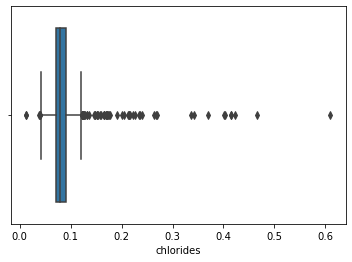

In [128]:
odfx = read_file('./Dataset1_train/train/X_train.xlsx')
sns.boxplot(odfx['chlorides'])


C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='chlorides'>

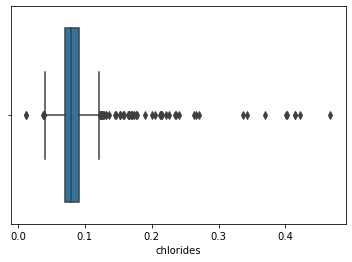

In [129]:

sns.boxplot(dfx['chlorides'])
# sns.boxplot(df['volatile_acidity'])
# sns.boxplot(df['citric_acid'])
# sns.boxplot(df['chlorides'])
# sns.boxplot(df['free_sulfur_dioxide'])
# sns.boxplot(df['total_sulfur_dioxide'])
# sns.boxplot(df['density'])
# sns.boxplot(df['pH'])
# sns.boxplot(df['sulphates'])
# sns.boxplot(df['alcohol'])
# sns.boxplot(df['class'])

In [130]:
Before_imputation = dfx
imputer = KNNImputer(n_neighbors=5, weights='distance')
After_imputation  = imputer.fit_transform(Before_imputation )
print("Data Before performing imputation\n",Before_imputation.values)
print("\n\nAfter performing imputation\n",After_imputation)

Data Before performing imputation
 [[ 7.    0.23  0.4  ...  3.5   0.63 11.1 ]
 [ 7.8   0.6   0.26 ...   nan  0.52  9.9 ]
 [ 9.7   0.69  0.32 ...  3.29  0.62 10.1 ]
 ...
 [ 7.8   0.53  0.04 ...  3.33   nan 10.  ]
 [ 7.3   0.43  0.24 ...  3.6   0.59 11.1 ]
 [ 9.1   0.5   0.3  ...  3.32  0.71 10.5 ]]


After performing imputation
 [[ 7.          0.23        0.4        ...  3.5         0.63
  11.1       ]
 [ 7.8         0.6         0.26       ...  3.21        0.52
   9.9       ]
 [ 9.7         0.69        0.32       ...  3.29        0.62
  10.1       ]
 ...
 [ 7.8         0.53        0.04       ...  3.33        0.63755961
  10.        ]
 [ 7.3         0.43        0.24       ...  3.6         0.59
  11.1       ]
 [ 9.1         0.5         0.3        ...  3.32        0.71
  10.5       ]]


In [131]:
def count_missing(data) : 
    missing = data.isnull().sum()  
    missing = missing[ missing>0 ]
        
    missing.sort_values( ascending=False, inplace=True )  
    count = pd.DataFrame( { 'Feature':missing.index, 'Missing Count':missing.values } ) 
    count[ 'Percentage' ] = count['Missing Count'].apply( lambda x: '{:.2%}'.format(x/data.shape[0] ))
    return  count

imputed = pd.DataFrame(After_imputation)
print(dfx.isnull().sum())
print(imputed.isnull().sum())


fixed_acidity           64
volatile_acidity        43
citric_acid             58
residual_sugar          38
chlorides               52
free_sulfur_dioxide     54
total_sulfur_dioxide    45
density                 43
pH                      58
sulphates               48
alcohol                 57
dtype: int64
0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
dtype: int64


In [132]:
# X_train, y_train = dfx.values, dfy['class'].values
X_train, y_train = imputed.values, dfy['class'].values
print(len(X_train))
print(len(y_train))
X_train_, X_val, y_train_, y_val = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train)
print(len(X_train_))
print(len(X_val))

990
990
792
198


In [133]:
# for depth in range(2, 30):
# #     X_train_, X_val, y_train_, y_val = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train)
#     clf = DecisionTree(max_depth=depth)
#     clf.fit(X_train_, y_train_)
#     train_pred = clf.predict(X_train)
#     y_pred = clf.predict(X_val)
#     acc = accuracy(y_val, y_pred)
#     trainacc = accuracy(train_pred, y_train)
#     print("Depth: ", depth, clf.getdeepest(), " Accuracy:", acc, trainacc)

In [134]:
model = RandomForest()
model.fit(X_train_, y_train_)
preds = model.predict(X_val)

[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 

[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 

[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 6 5 5 6 5 5 6 6 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 6 5 5 6 5 5 6 6 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 6 5 5 6 5 5 6 6 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 6 5 5 6 5 5 6 6 

[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 6 5 5 6 5 5 6 6 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 

[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7 5 5 5 7 6 3 4 7 6 5 5 5 5 6 5 6 8 5 5 5 7 6 5 7 7 5 7 7 5 6 5 5 5 7
 5 5 5 5 5 6 5 5 6 6 5 5 7 5 6 6 7 5 6 7 5 5 6 6 6 5 6 6 6 5 5 6 5 5 4 7 5
 5 5 5 5 5 6 6 5 5 5 6 6 7 5 6 5 7 6 6 6 5 5 7 5 6 6 5 5 6 6 5 6 7 5 5 5 5
 6 5 4 5 5 7 5 6 7 6 6 7 6 6 5 6 6 6 3 5 5 5 5 6 5 7 5 5 6 7 5 6 5 5 4 5 5
 7 6 6 7 6 5 6 6 5 3 5 5 5 5 7 7 6 4 6 5 6 5 6 6 5 5 6 6 5 6 7 6 5 6 6 6 5
 6 6 6 6 6 6 5 6 5 4 5 6 6 7 6 5 8 6 5 6 5 6 5 5 6 4 6 5 5 6 6 6 6 5 7 6 5
 6 7 5 6 5 7 5 4 5 5 6 6 6 6 5 6 5 6 5 6 6 5 6 7 6 6 6 5 7 6 7 7 6 4 7 6 6
 7 4 8 5 6 5 5 6 5 5 6 6 

 5 7 5 6 5 6 5 6 5 6 6 5 6 6 6]
_sample() takes 2 positional arguments but 3 were given
[[ 8.9         0.12000006  0.45       ...  3.41        0.76
  11.9       ]
 [ 8.82304993  0.5         0.36       ...  3.27        0.77
  10.8       ]
 [11.6         0.41        0.54       ...  3.02        0.76
   9.9       ]
 ...
 [12.4         0.35        0.49       ...  3.3525097   0.75
  10.4       ]
 [ 7.9         0.545       0.06       ...  3.36        0.67
  10.7       ]
 [ 8.2         0.64        0.27000031 ...  3.13        0.62
   9.1       ]]
[7 6 7 5 5 7 5 5 5 8 5 5 6 4 6 5 6 7 6 4 8 6 6 6 5 7 5 6 6 6 6 4 5 5 7 6 5
 5 6 6 7 5 5 5 5 5 6 5 6 5 6 6 5 5 5 5 5 7 6 6 7 4 6 5 5 7 7 5 5 5 6 5 5 5
 6 6 6 7 5 6 5 6 7 7 6 5 6 7 5 7 7 7 6 5 6 6 5 6 6 6 5 8 5 6 6 6 6 6 5 5 5
 6 5 8 5 6 5 6 5 6 5 7 5 5 7 6 7 6 5 7 6 6 6 5 6 5 6 6 5 6 6 6 6 6 6 6 5 5
 7 6 5 7 5 5 5 6 6 6 7 5 6 5 6 5 5 6 6 5 5 6 6 5 5 6 5 7 5 7 6 5 5 6 5 6 6
 7 5 6 6 6 5 6 5 5 6 6 6 6 4 6 5 6 6 5 5 6 6 6 5 5 5 6 5 5 6 5 8 5 5 6 5 5
 5 6 7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
report(preds, y_val)
print(np.bincount(preds))
print(np.bincount(y_val))
print(len(X_val))
print(len(X_train))